1,prepare data

In [5]:
import numpy as np
import matplotlib.pyplot as plt
import pandas
import math
from keras.models import Sequential
from keras.layers import Dense
from keras.layers.core import Dense, Dropout, Activation
from keras.layers import LSTM
from keras.regularizers import L1L2
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
import pandas as pd
from sklearn.metrics import r2_score
from sklearn.metrics import accuracy_score
import numpy
import time


In [2]:
def preparedata_steps(steps):
    df=pd.read_csv('SP500_new.csv', engine='python', skipfooter=1)
    #data=df.drop(['Date'], axis = 1)
    data=df.drop(['Date', 'Adj Close','Volume'], axis = 1)
    # normalize the dataset
    scaler_dataset = MinMaxScaler(feature_range=(0, 1))
    dataset = scaler_dataset.fit_transform(data)
    
    target=df['Adj Close']
    # normalize the dataset
    scaler_target = MinMaxScaler(feature_range=(0, 1))
    target = scaler_target.fit_transform(target)
    
    result = []
    for index in range(len(dataset) - steps): # maxmimum date = lastest date - sequence length
            result.append(dataset[index: index + steps]) # index : index + steps
            
    result = np.array(result)
    
    features=result[:]
    target=target[steps:]
    
    trainX=features[:-500]
    testX=features[-500:]
    trainY=target[:-500]
    testY=target[-500:]
    return trainX,trainY,testX,testY,scaler_dataset,scaler_target

5.1.1 Aapply Bias Weight Regularization

In [8]:
repeats=5
regularizers = [L1L2(l1=0.0, l2=0.0), L1L2(l1=0.01, l2=0.0), L1L2(l1=0.0, l2=0.01), L1L2(l1=0.01, l2=0.01)]

C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:321: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:356: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:374: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a sing

accuracy plot


C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:374: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)


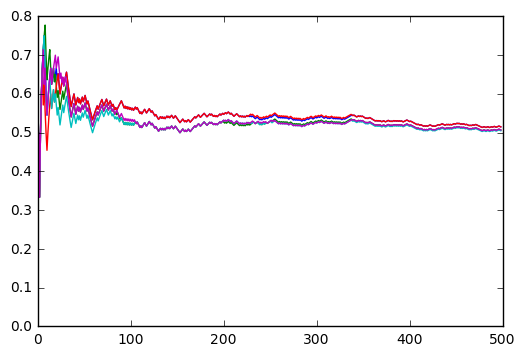

adjclose plot


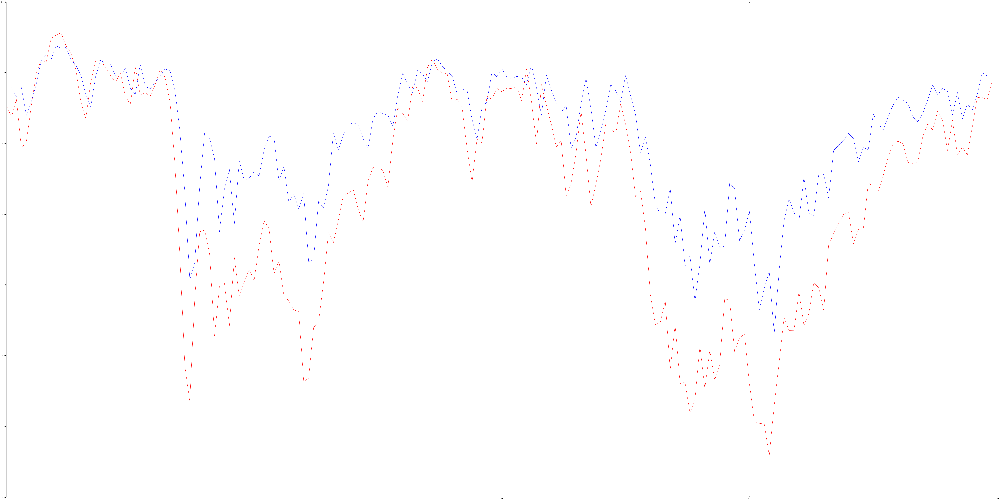

mean of test_RMSE
88.1862466957
std of test_RMSE
11.6147498188
mean of test_r2Score
0.642523482471
std of test_r2Score
0.0930837080895
mean of accuracy_all
0.533841357134
std of accuracy_all
0.00827986427979
mean of accuracy_30
0.625806451613
std of accuracy_30
0.0258064516129


C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:321: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:356: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:374: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a sing

accuracy plot


C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:374: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)


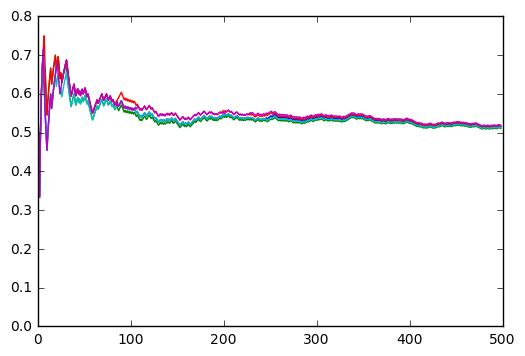

adjclose plot


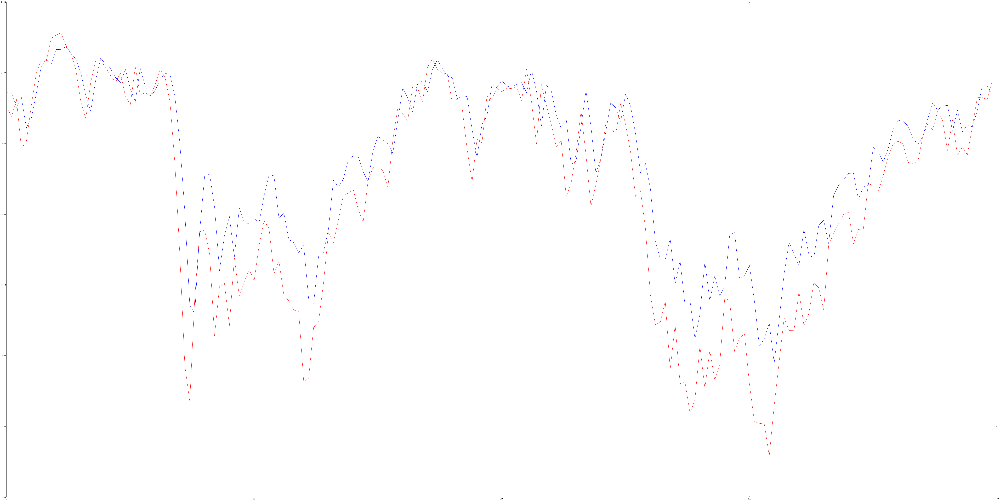

mean of test_RMSE
60.2400545424
std of test_RMSE
4.12301689751
mean of test_r2Score
0.835268293227
std of test_r2Score
0.0223661671513
mean of accuracy_all
0.544513653298
std of accuracy_all
0.00522590244451
mean of accuracy_30
0.670967741935
std of accuracy_30
0.0129032258065


C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:321: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:356: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:374: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a sing

accuracy plot


C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:374: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)


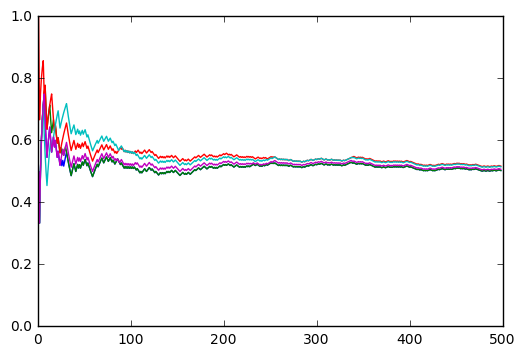

adjclose plot


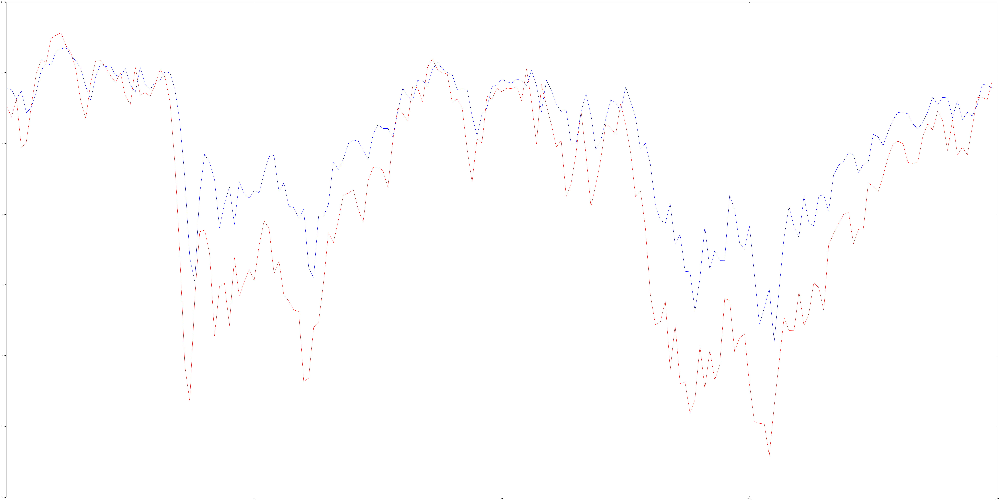

mean of test_RMSE
72.1581998724
std of test_RMSE
16.6442483628
mean of test_r2Score
0.752222810116
std of test_r2Score
0.11212272388
mean of accuracy_all
0.531696401425
std of accuracy_all
0.0150133392022
mean of accuracy_30
0.612903225806
std of accuracy_30
0.0577049800645


C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:321: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:356: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:374: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a sing

accuracy plot


C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:374: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)


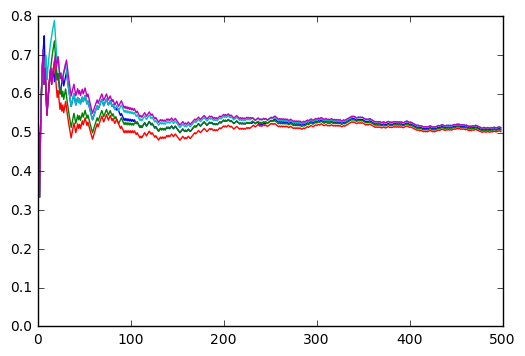

adjclose plot


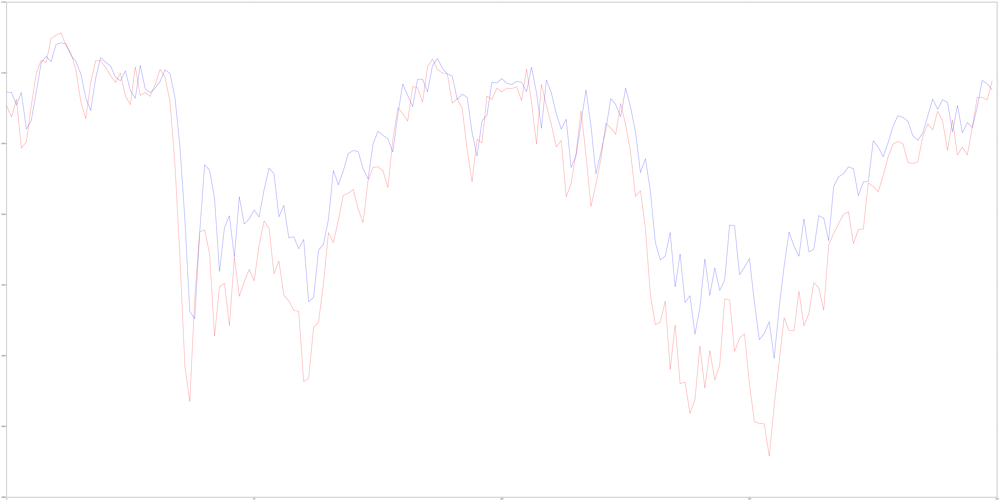

mean of test_RMSE
67.6777037083
std of test_RMSE
10.532288769
mean of test_r2Score
0.788036631484
std of test_r2Score
0.0681206741656
mean of accuracy_all
0.531895712649
std of accuracy_all
0.0105966408793
mean of accuracy_30
0.638709677419
std of accuracy_30
0.0376190444829


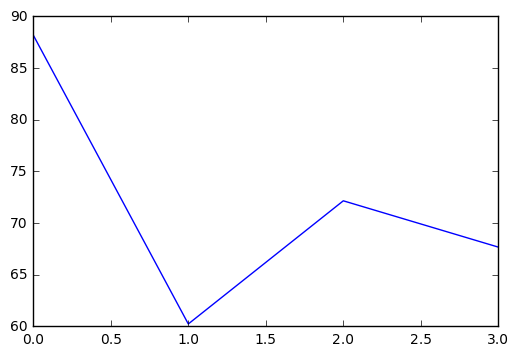

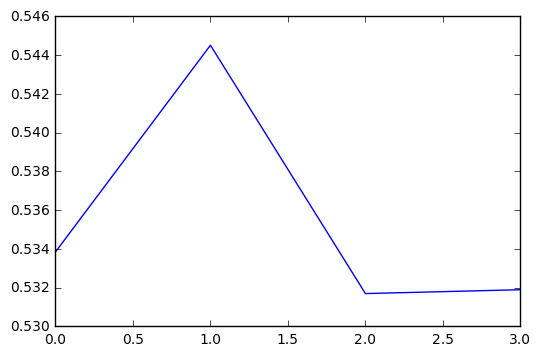

time cost
39428.96020746231


In [9]:
start = time.time()

test_RMSE_all=[]
accuracy_all_all=[]

for reg in regularizers:
    test_RMSE=[]
    test_r2Score=[]
    accuracy_all=[]
    accuracy_30=[]
    for i in range(repeats):
        trainX,trainY,testX,testY,scaler_dataset,scaler_target=preparedata_steps(15)
        # create and fit the LSTM network
        model = Sequential()
        model.add(LSTM(7, batch_input_shape=(1, trainX.shape[1], trainX.shape[2]), stateful=True,bias_regularizer=reg))
        model.add(Dense(1))
        model.compile(loss='mean_squared_error', optimizer='adam')
        for i in range(100):
            model.fit(trainX, trainY, epochs=1, batch_size=1, verbose=0, shuffle=False)
            model.reset_states()

        # make predictions
        testPredict = model.predict(testX, batch_size=1)
        # invert predictions
        testPredict =  scaler_target.inverse_transform(testPredict)
        testY =  scaler_target.inverse_transform(testY)
        # calculate root mean squared error and R2 score
        test_RMSE.append(math.sqrt(mean_squared_error(testY, testPredict)))
        test_r2Score.append(r2_score(testY, testPredict))
        #transfer to classification probelm
        test_true=testY[:]
        test_pred=testPredict[:]

        test_true_clssfi=[]
        for  i in range(1,len(test_true)):
            if test_true[i]>test_true[i-1]:
                test_true_clssfi.append(1)
            else:
                test_true_clssfi.append(0)

        test_pred_clssfi=[]
        for  i in range(1,len(test_pred)):
            if test_pred[i]>test_true[i-1]:
                test_pred_clssfi.append(1)
            else:
                test_pred_clssfi.append(0)

        accuracy=[]
        for i in range(1,len(test_pred_clssfi)+1):
            accuracy.append(accuracy_score(test_true_clssfi[0:i],test_pred_clssfi[0:i]))
        plt.plot(accuracy)
        accuracy_all.append(np.mean(accuracy))
        accuracy_30.append(np.mean(accuracy[30]))

    print('accuracy plot')    
    plt.show()

    print('adjclose plot')  
    test_true=testY[:200]
    test_pred=testPredict[:200]

    fig, ax = plt.subplots(figsize=(100, 50))
    plt.plot(test_true,color='red')
    plt.plot(test_pred,color='blue')
    plt.show()

    print('mean of test_RMSE')
    print(np.mean(test_RMSE))

    print('std of test_RMSE')
    print(np.std(test_RMSE))

    print('mean of test_r2Score')
    print(np.mean(test_r2Score))

    print('std of test_r2Score')
    print(np.std(test_r2Score))

    print('mean of accuracy_all')
    print(np.mean(accuracy_all))

    print('std of accuracy_all')
    print(np.std(accuracy_all))

    print('mean of accuracy_30')
    print(np.mean(accuracy_30))

    print('std of accuracy_30')
    print(np.std(accuracy_30))

    test_RMSE_all.append(np.mean(test_RMSE))
    accuracy_all_all.append(np.mean(accuracy_all))
  
    

plt.plot(test_RMSE_all)
plt.show()

plt.plot(accuracy_all_all)
plt.show()


print('time cost')
print( time.time() - start)  

5.1.2 Aapply Input Weight Regularization

In [10]:
repeats=5
regularizers = [L1L2(l1=0.0, l2=0.0), L1L2(l1=0.01, l2=0.0), L1L2(l1=0.0, l2=0.01), L1L2(l1=0.01, l2=0.01)]

C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:321: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:356: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:374: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a sing

accuracy plot


C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:374: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)


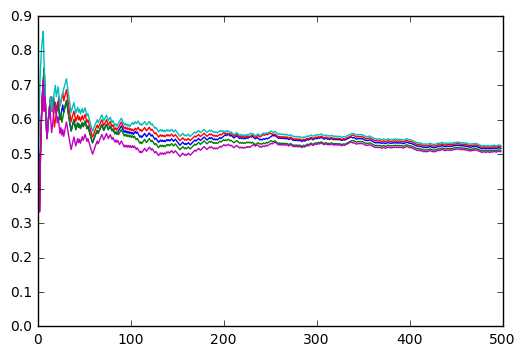

adjclose plot


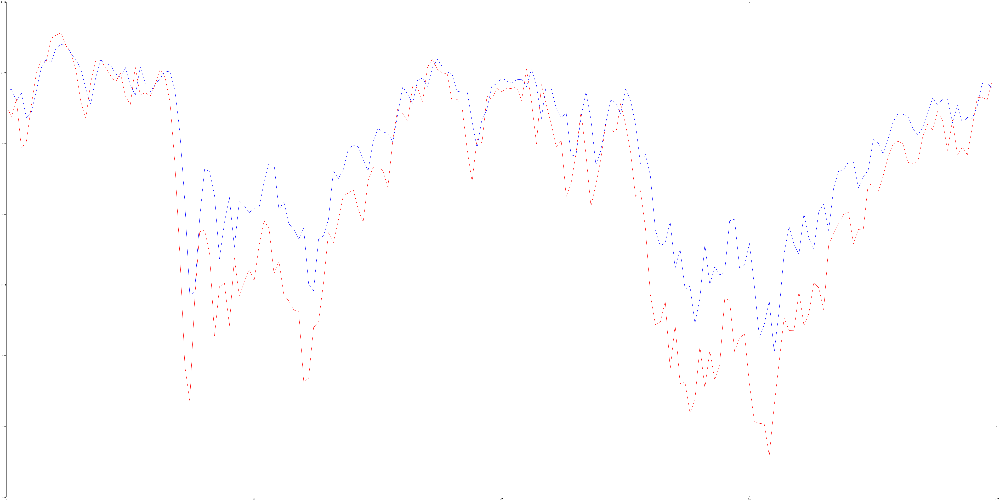

mean of test_RMSE
67.3919963372
std of test_RMSE
15.4761683222
mean of test_r2Score
0.783970494469
std of test_r2Score
0.10164954117
mean of accuracy_all
0.545889320362
std of accuracy_all
0.0145860994742
mean of accuracy_30
0.651612903226
std of accuracy_30
0.0427951585852


C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:321: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:356: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:374: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a sing

accuracy plot


C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:374: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)


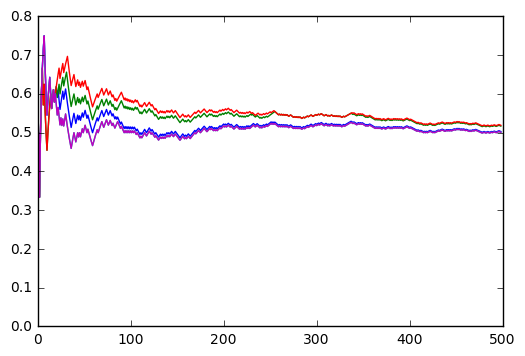

adjclose plot


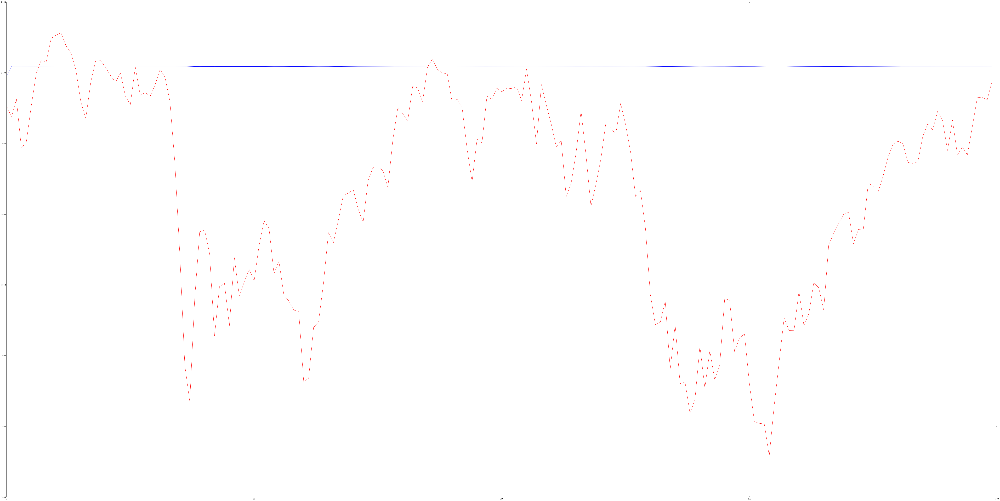

mean of test_RMSE
155.072909262
std of test_RMSE
1.13807693013
mean of test_r2Score
-0.0866059041937
std of test_r2Score
0.0159790275793
mean of accuracy_all
0.527589428928
std of accuracy_all
0.0179444774276
mean of accuracy_30
0.606451612903
std of accuracy_30
0.0516129032258


C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:321: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:356: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:374: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a sing

accuracy plot


C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:374: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)


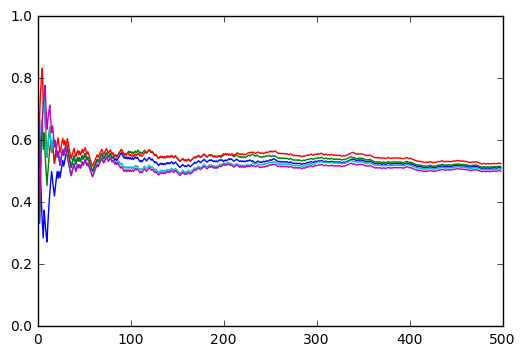

adjclose plot


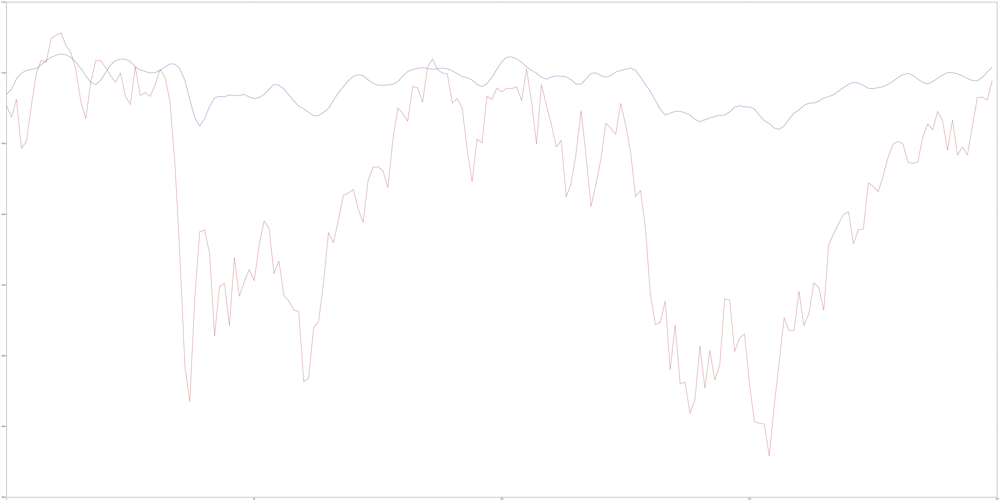

mean of test_RMSE
122.843946439
std of test_RMSE
14.6566624158
mean of test_r2Score
0.308450953847
std of test_r2Score
0.162073194248
mean of accuracy_all
0.530648042496
std of accuracy_all
0.013648161819
mean of accuracy_30
0.574193548387
std of accuracy_30
0.0129032258065


C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:321: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:356: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:374: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a sing

accuracy plot


C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:374: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)


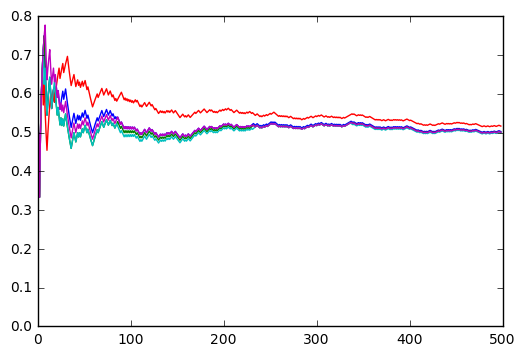

adjclose plot


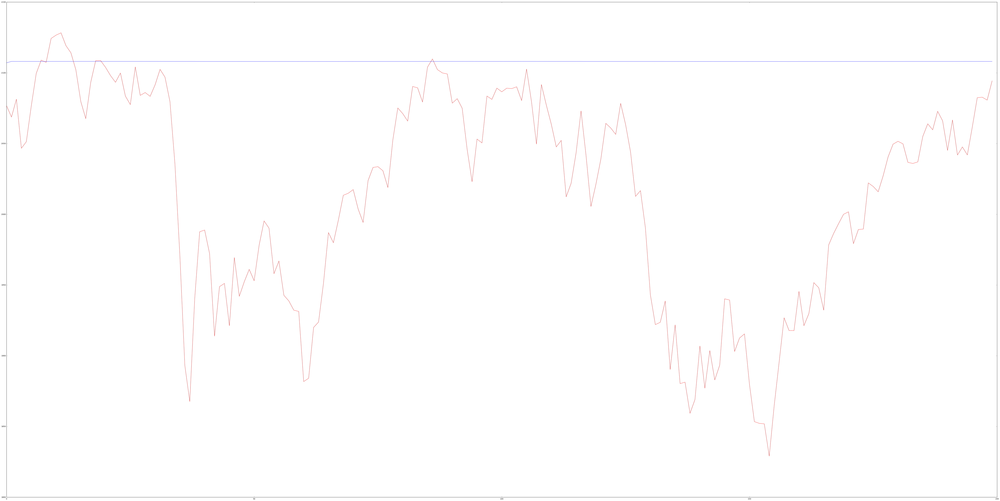

mean of test_RMSE
154.072596557
std of test_RMSE
1.61602715406
mean of test_r2Score
-0.0726928347406
std of test_r2Score
0.0225296699643
mean of accuracy_all
0.521322850154
std of accuracy_all
0.0160514370042
mean of accuracy_30
0.593548387097
std of accuracy_30
0.0482794501519


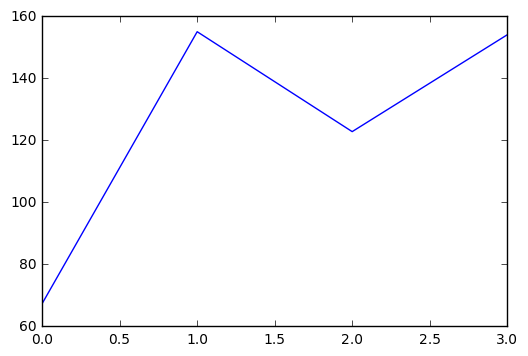

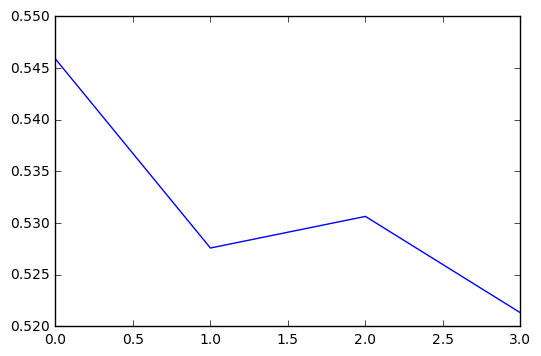

time cost
40010.679480075836


In [11]:
start = time.time()

test_RMSE_all=[]
accuracy_all_all=[]

for reg in regularizers:
    test_RMSE=[]
    test_r2Score=[]
    accuracy_all=[]
    accuracy_30=[]
    for i in range(repeats):
        trainX,trainY,testX,testY,scaler_dataset,scaler_target=preparedata_steps(15)
        # create and fit the LSTM network
        model = Sequential()
        model.add(LSTM(7, batch_input_shape=(1, trainX.shape[1], trainX.shape[2]), stateful=True,kernel_regularizer=reg))
        model.add(Dense(1))
        model.compile(loss='mean_squared_error', optimizer='adam')
        for i in range(100):
            model.fit(trainX, trainY, epochs=1, batch_size=1, verbose=0, shuffle=False)
            model.reset_states()

        # make predictions
        testPredict = model.predict(testX, batch_size=1)
        # invert predictions
        testPredict =  scaler_target.inverse_transform(testPredict)
        testY =  scaler_target.inverse_transform(testY)
        # calculate root mean squared error and R2 score
        test_RMSE.append(math.sqrt(mean_squared_error(testY, testPredict)))
        test_r2Score.append(r2_score(testY, testPredict))
        #transfer to classification probelm
        test_true=testY[:]
        test_pred=testPredict[:]

        test_true_clssfi=[]
        for  i in range(1,len(test_true)):
            if test_true[i]>test_true[i-1]:
                test_true_clssfi.append(1)
            else:
                test_true_clssfi.append(0)

        test_pred_clssfi=[]
        for  i in range(1,len(test_pred)):
            if test_pred[i]>test_true[i-1]:
                test_pred_clssfi.append(1)
            else:
                test_pred_clssfi.append(0)

        accuracy=[]
        for i in range(1,len(test_pred_clssfi)+1):
            accuracy.append(accuracy_score(test_true_clssfi[0:i],test_pred_clssfi[0:i]))
        plt.plot(accuracy)
        accuracy_all.append(np.mean(accuracy))
        accuracy_30.append(np.mean(accuracy[30]))

    print('accuracy plot')    
    plt.show()

    print('adjclose plot')  
    test_true=testY[:200]
    test_pred=testPredict[:200]

    fig, ax = plt.subplots(figsize=(100, 50))
    plt.plot(test_true,color='red')
    plt.plot(test_pred,color='blue')
    plt.show()

    print('mean of test_RMSE')
    print(np.mean(test_RMSE))

    print('std of test_RMSE')
    print(np.std(test_RMSE))

    print('mean of test_r2Score')
    print(np.mean(test_r2Score))

    print('std of test_r2Score')
    print(np.std(test_r2Score))

    print('mean of accuracy_all')
    print(np.mean(accuracy_all))

    print('std of accuracy_all')
    print(np.std(accuracy_all))

    print('mean of accuracy_30')
    print(np.mean(accuracy_30))

    print('std of accuracy_30')
    print(np.std(accuracy_30))

    test_RMSE_all.append(np.mean(test_RMSE))
    accuracy_all_all.append(np.mean(accuracy_all))
  
    

plt.plot(test_RMSE_all)
plt.show()

plt.plot(accuracy_all_all)
plt.show()


print('time cost')
print( time.time() - start)  

In [ ]:
5.1.3 Aapply Recurrent Weight Regularization

In [12]:
repeats=5
regularizers = [L1L2(l1=0.0, l2=0.0), L1L2(l1=0.01, l2=0.0), L1L2(l1=0.0, l2=0.01), L1L2(l1=0.01, l2=0.01)]

C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:321: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:356: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:374: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a sing

accuracy plot


C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:374: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)


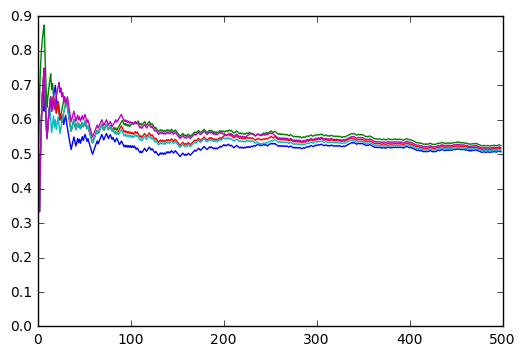

adjclose plot


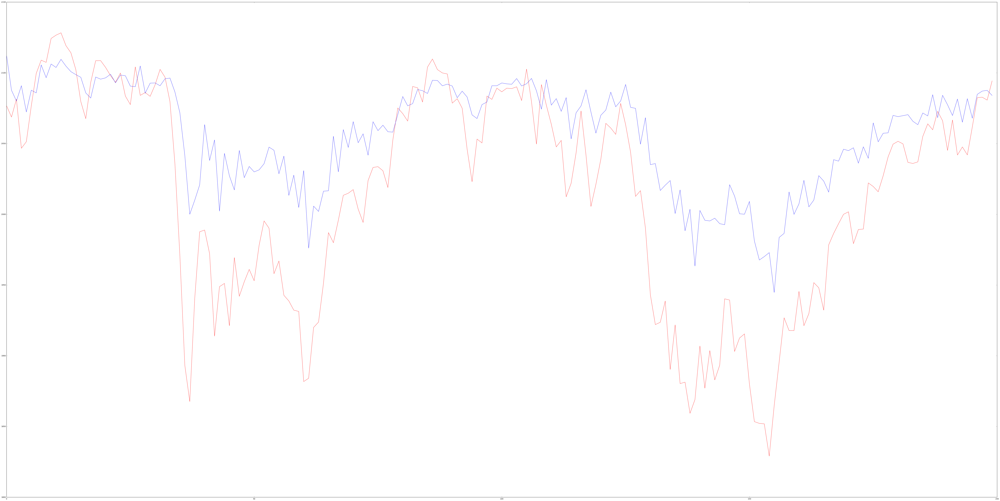

mean of test_RMSE
73.2622506476
std of test_RMSE
16.0173884295
mean of test_r2Score
0.745893672618
std of test_r2Score
0.111129153933
mean of accuracy_all
0.545726911372
std of accuracy_all
0.0135387181728
mean of accuracy_30
0.638709677419
std of accuracy_30
0.0129032258065


C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:321: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:356: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:374: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a sing

accuracy plot


C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:374: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)


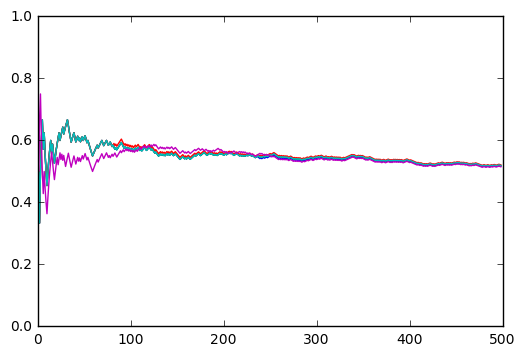

adjclose plot


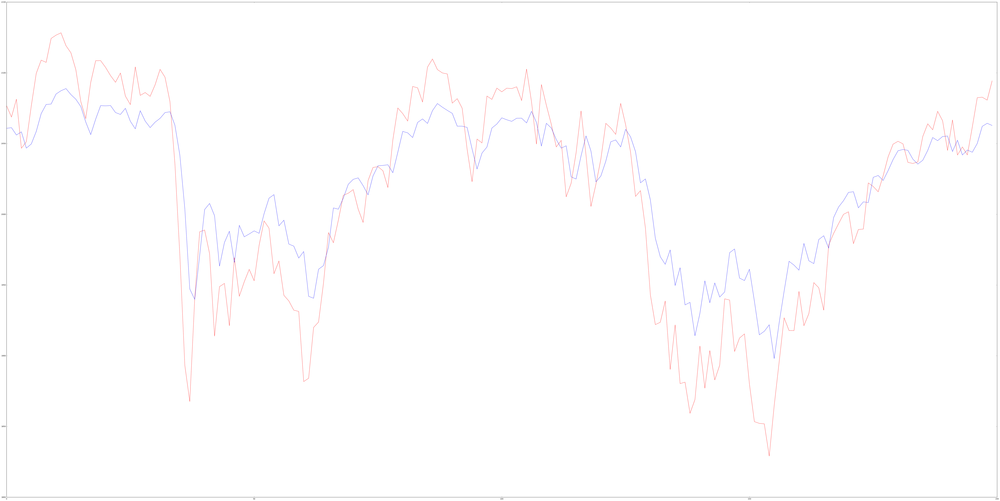

mean of test_RMSE
108.5556488
std of test_RMSE
9.81841403512
mean of test_r2Score
0.463190822649
std of test_r2Score
0.0964762341619
mean of accuracy_all
0.549102535638
std of accuracy_all
0.00338645891466
mean of accuracy_30
0.61935483871
std of accuracy_30
0.0516129032258


C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:321: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:356: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:374: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a sing

accuracy plot


C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:374: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)


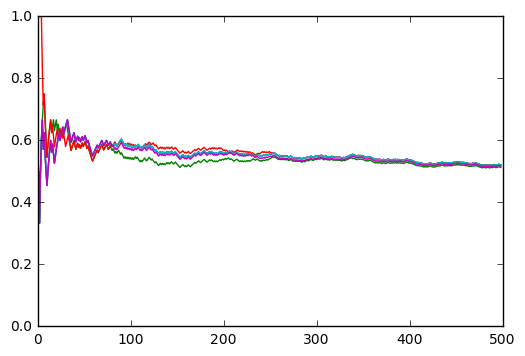

adjclose plot


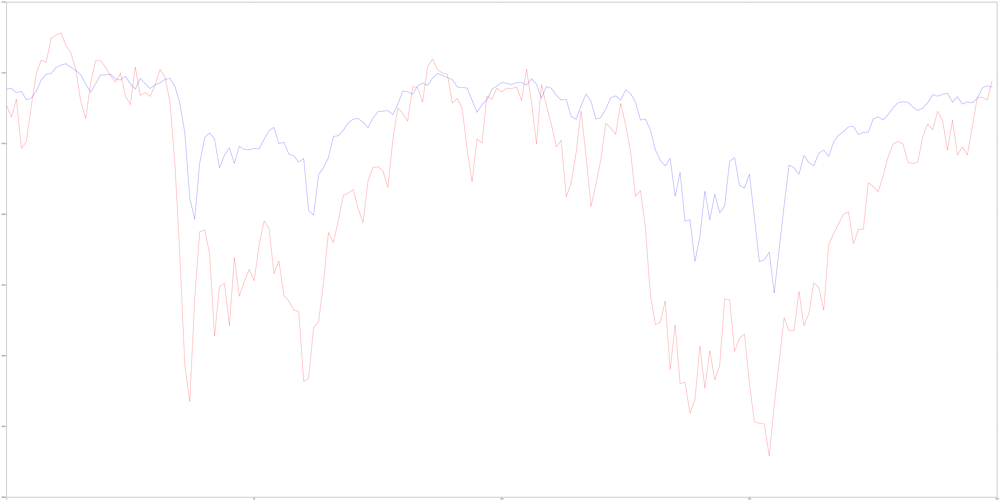

mean of test_RMSE
106.144799609
std of test_RMSE
16.2937895132
mean of test_r2Score
0.478938249137
std of test_r2Score
0.172097734252
mean of accuracy_all
0.551805449303
std of accuracy_all
0.00767256139362
mean of accuracy_30
0.632258064516
std of accuracy_30
0.0258064516129


C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:321: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:356: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:374: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a sing

accuracy plot


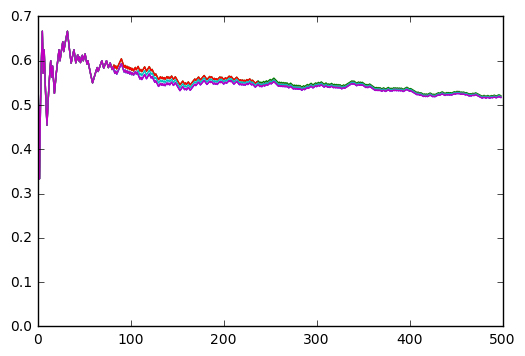

adjclose plot


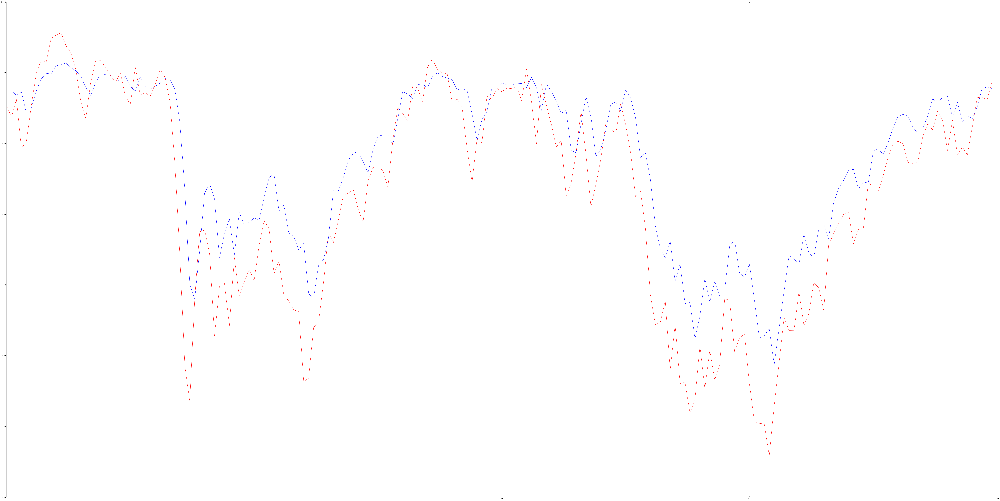

mean of test_RMSE
98.3084284969
std of test_RMSE
5.418215154
mean of test_r2Score
0.561998575783
std of test_r2Score
0.048732832122
mean of accuracy_all
0.549964450573
std of accuracy_all
0.00269102246431
mean of accuracy_30
0.645161290323
std of accuracy_30
0.0


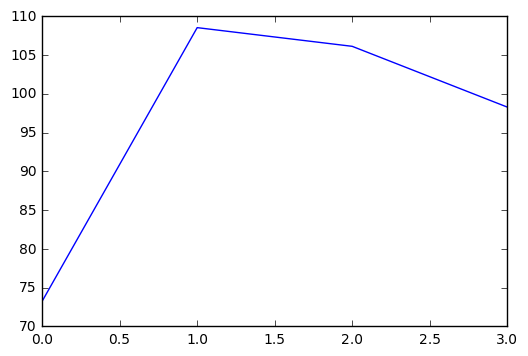

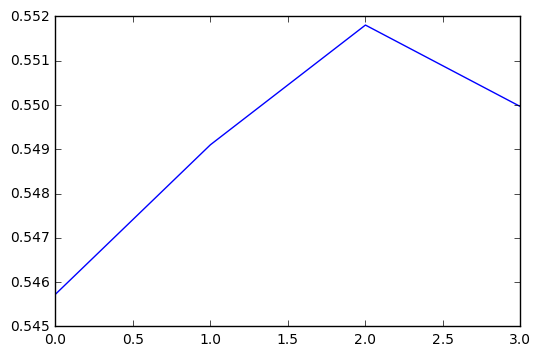

time cost
42834.89601588249


In [13]:
start = time.time()

test_RMSE_all=[]
accuracy_all_all=[]

for reg in regularizers:
    test_RMSE=[]
    test_r2Score=[]
    accuracy_all=[]
    accuracy_30=[]
    for i in range(repeats):
        trainX,trainY,testX,testY,scaler_dataset,scaler_target=preparedata_steps(15)
        # create and fit the LSTM network
        model = Sequential()
        model.add(LSTM(7, batch_input_shape=(1, trainX.shape[1], trainX.shape[2]), stateful=True,recurrent_regularizer=reg))
        model.add(Dense(1))
        model.compile(loss='mean_squared_error', optimizer='adam')
        for i in range(100):
            model.fit(trainX, trainY, epochs=1, batch_size=1, verbose=0, shuffle=False)
            model.reset_states()

        # make predictions
        testPredict = model.predict(testX, batch_size=1)
        # invert predictions
        testPredict =  scaler_target.inverse_transform(testPredict)
        testY =  scaler_target.inverse_transform(testY)
        # calculate root mean squared error and R2 score
        test_RMSE.append(math.sqrt(mean_squared_error(testY, testPredict)))
        test_r2Score.append(r2_score(testY, testPredict))
        #transfer to classification probelm
        test_true=testY[:]
        test_pred=testPredict[:]

        test_true_clssfi=[]
        for  i in range(1,len(test_true)):
            if test_true[i]>test_true[i-1]:
                test_true_clssfi.append(1)
            else:
                test_true_clssfi.append(0)

        test_pred_clssfi=[]
        for  i in range(1,len(test_pred)):
            if test_pred[i]>test_true[i-1]:
                test_pred_clssfi.append(1)
            else:
                test_pred_clssfi.append(0)

        accuracy=[]
        for i in range(1,len(test_pred_clssfi)+1):
            accuracy.append(accuracy_score(test_true_clssfi[0:i],test_pred_clssfi[0:i]))
        plt.plot(accuracy)
        accuracy_all.append(np.mean(accuracy))
        accuracy_30.append(np.mean(accuracy[30]))

    print('accuracy plot')    
    plt.show()

    print('adjclose plot')  
    test_true=testY[:200]
    test_pred=testPredict[:200]

    fig, ax = plt.subplots(figsize=(100, 50))
    plt.plot(test_true,color='red')
    plt.plot(test_pred,color='blue')
    plt.show()

    print('mean of test_RMSE')
    print(np.mean(test_RMSE))

    print('std of test_RMSE')
    print(np.std(test_RMSE))

    print('mean of test_r2Score')
    print(np.mean(test_r2Score))

    print('std of test_r2Score')
    print(np.std(test_r2Score))

    print('mean of accuracy_all')
    print(np.mean(accuracy_all))

    print('std of accuracy_all')
    print(np.std(accuracy_all))

    print('mean of accuracy_30')
    print(np.mean(accuracy_30))

    print('std of accuracy_30')
    print(np.std(accuracy_30))

    test_RMSE_all.append(np.mean(test_RMSE))
    accuracy_all_all.append(np.mean(accuracy_all))
  
    

plt.plot(test_RMSE_all)
plt.show()

plt.plot(accuracy_all_all)
plt.show()


print('time cost')
print( time.time() - start)  